In [1]:
from __future__ import print_function
import time
import numpy as np
import pandas as pd
# from sklearn.datasets import fetch_mldata
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import umap.umap_ as umap
import plotly.express as px

In [2]:
df = pd.read_csv("./UJIndoorLoc/trainingData.csv")
def visualisation_target(target):
    train_col = df.columns[:520]
    X = df[train_col]
    y = df[target]
    return X,y
X,y = visualisation_target("BUILDINGID")
print(X.shape, y.shape)

(19937, 520) (19937,)


## PCA Visualisation (Target = BUILDINGID)

In [3]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(X.values)
df['pca-one'] = pca_result[:,0]
df['pca-two'] = pca_result[:,1] 
df['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

Explained variation per principal component: [0.14657091 0.05479158 0.04952448]


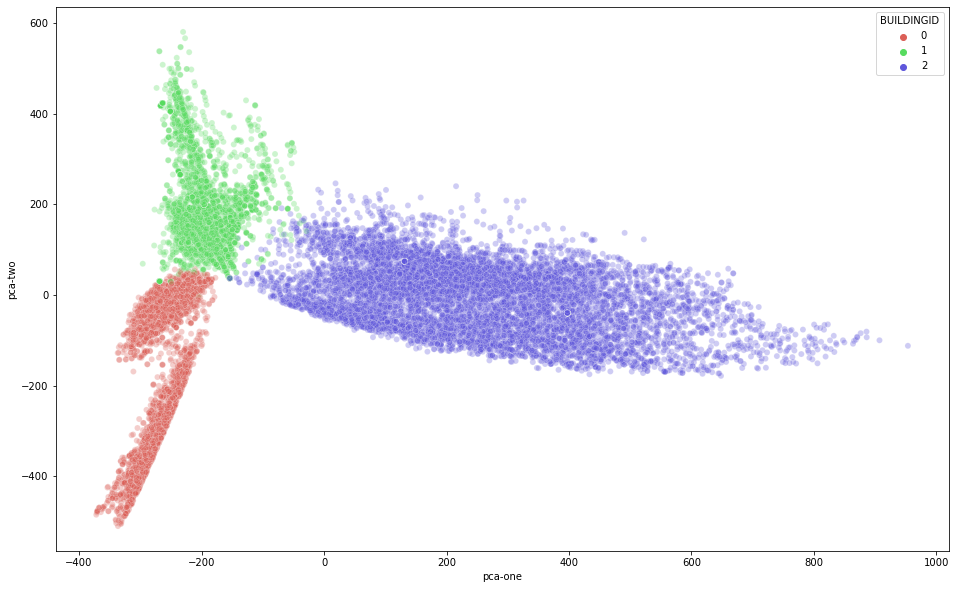

In [4]:
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="BUILDINGID",
    palette=sns.color_palette("hls", 3),
    data=df.loc[rndperm,:],
    legend="full",
    alpha=0.3
)

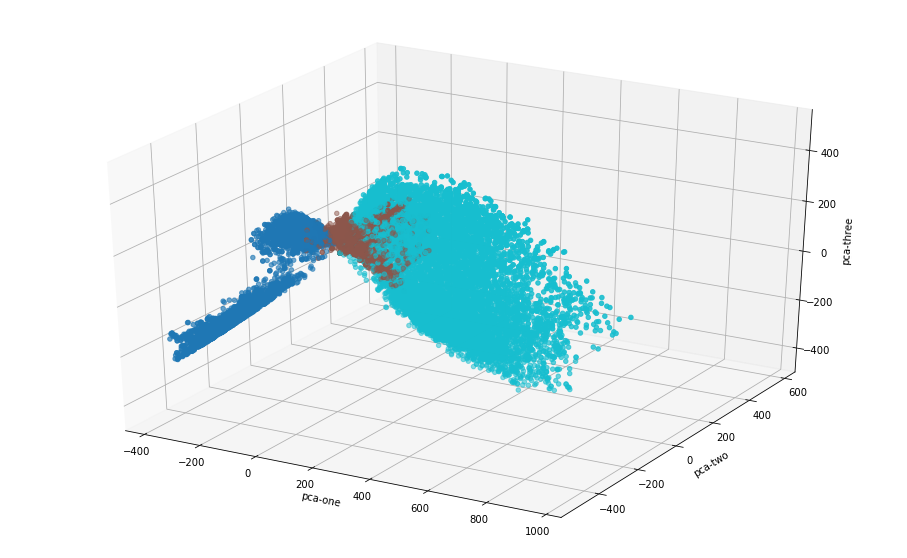

In [5]:
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df.loc[rndperm,:]["pca-one"], 
    ys=df.loc[rndperm,:]["pca-two"], 
    zs=df.loc[rndperm,:]["pca-three"], 
    c=df.loc[rndperm,:]["BUILDINGID"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.show()

### t-SNE with n_components = 3 (BUILDINGID is the target variable)

In [6]:
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=300,random_state = 42)
tsne_results = tsne.fit_transform(df)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))
df['tsne-2d-one'] = tsne_results[:,0]
df['tsne-2d-two'] = tsne_results[:,1]
fig_2d = px.scatter(
    tsne_results, x=0, y=1,
    color=df.BUILDINGID, labels={'color': 'BUILDINGID'}
)
fig_2d.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 19937 samples in 0.011s...
[t-SNE] Computed neighbors for 19937 samples in 18.271s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19937
[t-SNE] Computed conditional probabilities for sample 2000 / 19937
[t-SNE] Computed conditional probabilities for sample 3000 / 19937
[t-SNE] Computed conditional probabilities for sample 4000 / 19937
[t-SNE] Computed conditional probabilities for sample 5000 / 19937
[t-SNE] Computed conditional probabilities for sample 6000 / 19937
[t-SNE] Computed conditional probabilities for sample 7000 / 19937
[t-SNE] Computed conditional probabilities for sample 8000 / 19937
[t-SNE] Computed conditional probabilities for sample 9000 / 19937
[t-SNE] Computed conditional probabilities for sample 10000 / 19937
[t-SNE] Computed conditional probabilities for sample 11000 / 19937
[t-SNE] Computed conditional probabilities for sample 12000 / 19937
[t-SNE] Computed conditional probabilities for s

In [7]:
projections = tsne_results


fig = px.scatter_3d(
    projections, x=0, y=1, z=2,
    color=df.BUILDINGID, labels={'color': 'BUILDINGID'}
)
fig.update_layout(
    autosize=False,
    width=1000,
    height=1200
)
fig.update_traces(marker_size=8)
fig.show()

### t-SNE with n_components = 2 (BUILDINGID is the target variable)

In [8]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300, random_state = 42)
tsne_results = tsne.fit_transform(df)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))
df['tsne-2d-one'] = tsne_results[:,0]
df['tsne-2d-two'] = tsne_results[:,1]
fig_2d = px.scatter(
    tsne_results, x=0, y=1,
    color=df.BUILDINGID, labels={'color': 'BUILDINGID'}
)

fig_2d.show()

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 19937 samples in 0.007s...
[t-SNE] Computed neighbors for 19937 samples in 8.835s...
[t-SNE] Computed conditional probabilities for sample 1000 / 19937
[t-SNE] Computed conditional probabilities for sample 2000 / 19937
[t-SNE] Computed conditional probabilities for sample 3000 / 19937
[t-SNE] Computed conditional probabilities for sample 4000 / 19937
[t-SNE] Computed conditional probabilities for sample 5000 / 19937
[t-SNE] Computed conditional probabilities for sample 6000 / 19937
[t-SNE] Computed conditional probabilities for sample 7000 / 19937
[t-SNE] Computed conditional probabilities for sample 8000 / 19937
[t-SNE] Computed conditional probabilities for sample 9000 / 19937
[t-SNE] Computed conditional probabilities for sample 10000 / 19937
[t-SNE] Computed conditional probabilities for sample 11000 / 19937
[t-SNE] Computed conditional probabilities for sample 12000 / 19937
[t-SNE] Computed conditional probabilities for sa

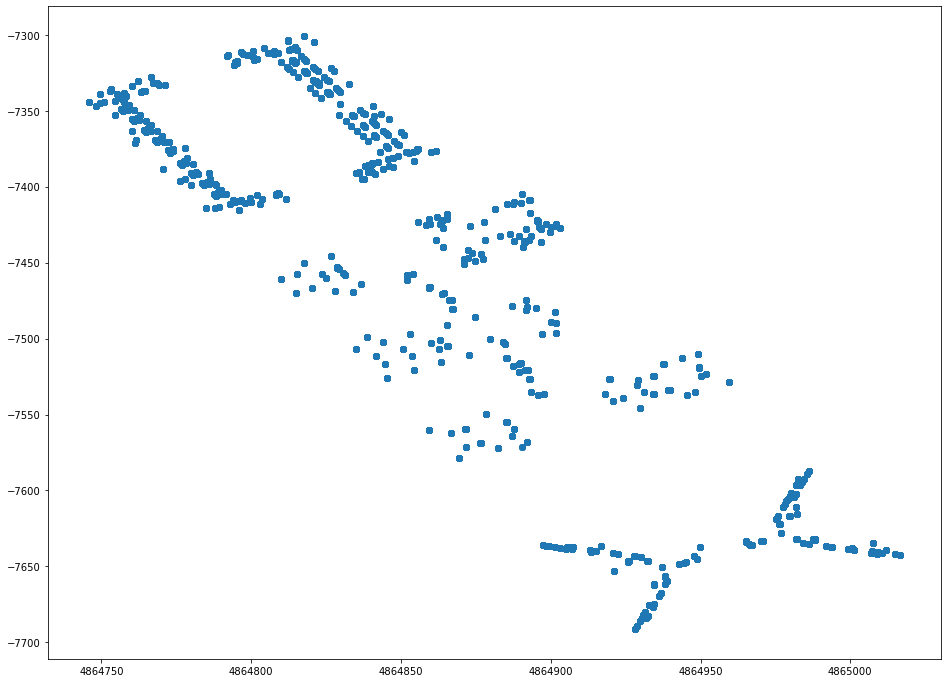

In [9]:
plt.figure(figsize=(16,12))
plt.scatter(df['LATITUDE'],df["LONGITUDE"])

## UMAP Visualisation

In [10]:

umap_2d = umap.UMAP(n_components=3, init='random', random_state=42)
umap_3d = umap.UMAP(n_components=3, init='random', random_state=42)

proj_2d = umap_2d.fit_transform(df)
proj_3d = umap_3d.fit_transform(df)

fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df.BUILDINGID, labels={'color': 'BUILDINGID'}
)
fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=df.BUILDINGID, labels={'color': 'BUILDINGID'}
)
fig_3d.update_traces(marker_size=5)

fig_2d.show()
fig_3d.show()